## **Spotify Recommendation System**

### **Project Overview**
This project involves building a Spotify Recommendation System using machine learning techniques and Spotify's audio features dataset. The system analyzes the characteristics of songs, genres, and trends over time to provide personalized song recommendations.

### **Key Features**
1. **Data Analysis and Visualization**:
    - Explored the dataset to understand trends in music over decades.
    - Visualized correlations between audio features and song popularity.
    - Analyzed the evolution of sound features over time.

2. **Clustering**:
    - Used K-Means clustering to group songs and genres based on their audio features.
    - Visualized clusters using dimensionality reduction techniques like PCA and t-SNE.

3. **Recommendation System**:
    - Built a recommendation engine that suggests songs based on user input.
    - Utilized Spotify's Web API to fetch additional song data.

4. **Libraries and Tools**:
    - Python libraries: `pandas`, `numpy`, `seaborn`, `matplotlib`, `plotly`, `scikit-learn`, `spotipy`.
    - Spotify Web API for fetching song metadata and audio features.

### **Steps in the Project**
1. **Data Preparation**:
    - Loaded and cleaned datasets (`data.csv`, `data_by_genres.csv`, `data_by_year.csv`).
    - Extracted relevant features for analysis and modeling.

2. **Exploratory Data Analysis (EDA)**:
    - Examined missing values, unique values, and summary statistics.
    - Visualized trends in music features over decades.

3. **Clustering**:
    - Grouped genres and songs into clusters using K-Means.
    - Visualized clusters to understand similarities between genres and songs.

4. **Recommendation System**:
    - Designed a system to recommend songs based on user preferences.
    - Calculated similarity using cosine distance and feature vectors.

5. **Visualization**:
    - Used `plotly` and `seaborn` for interactive and static visualizations.
    - Displayed trends, clusters, and feature correlations.

### **Outcomes**
- Identified key features influencing song popularity.
- Grouped similar genres and songs into meaningful clusters.
- Built a functional recommendation system capable of suggesting songs based on user input.

### **Future Work**
- Enhance the recommendation system by incorporating user listening history.
- Explore deep learning models for more accurate recommendations.
- Integrate real-time data from Spotify for dynamic recommendations.

# **Import Libraries**

In [1]:
%pip install numpy pandas seaborn plotly matplotlib scikit-learn scipy



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install numpy pandas seaborn plotly matplotlib scikit-learn scipy

import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


# **Read Data**

In [3]:
df=pd.read_csv("data/data.csv")
genre_df=pd.read_csv("data/data_by_genres.csv")
year_df=pd.read_csv("data/data_by_year.csv")

In [4]:
# show the first 5 rows of the data
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [5]:
df.shape

(170653, 19)

In [6]:
# Show the columns of the data
print("Columns:", df.columns)

Columns: Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'id', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'name', 'popularity', 'release_date',
       'speechiness', 'tempo'],
      dtype='object')


In [7]:
# Show the data types of the columns
print("\nData Types:")
print(df.dtypes)


Data Types:
valence             float64
year                  int64
acousticness        float64
artists              object
danceability        float64
duration_ms           int64
energy              float64
explicit              int64
id                   object
instrumentalness    float64
key                   int64
liveness            float64
loudness            float64
mode                  int64
name                 object
popularity            int64
release_date         object
speechiness         float64
tempo               float64
dtype: object


In [8]:
# Show the number of missing values in each column
print("\nMissing Values:")
print(df.isnull().sum())



Missing Values:
valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64


In [9]:

# Show the number of unique values in each column
print("\nNumber of Unique Values:")
print(df.nunique())




Number of Unique Values:
valence               1733
year                   100
acousticness          4689
artists              34088
danceability          1240
duration_ms          51755
energy                2332
explicit                 2
id                  170653
instrumentalness      5401
key                     12
liveness              1740
loudness             25410
mode                     2
name                133638
popularity             100
release_date         11244
speechiness           1626
tempo                84694
dtype: int64


In [10]:
# Show the summary statistics of the data
df.describe()


,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653.000000,1.706530e+05,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000
mean,0.528587,1976.787241,0.502115,0.537396,2.309483e+05,0.482389,0.084575,0.167010,5.199844,0.205839,-11.467990,0.706902,31.431794,0.098393,116.861590
std,0.263171,25.917853,0.376032,0.176138,1.261184e+05,0.267646,0.278249,0.313475,3.515094,0.174805,5.697943,0.455184,21.826615,0.162740,30.708533
min,0.000000,1921.000000,0.000000,0.000000,5.108000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,0.415000,1.698270e+05,0.255000,0.000000,0.000000,2.000000,0.098800,-14.615000,0.000000,11.000000,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,0.548000,2.074670e+05,0.471000,0.000000,0.000216,5.000000,0.136000,-10.580000,1.000000,33.000000,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,0.668000,2.624000e+05,0.703000,0.000000,0.102000,8.000000,0.261000,-7.183000,1.000000,48.000000,0.075600,135.537000
max,1.000000,2020.000000,0.996000,0.988000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.970000,243.507000


In [11]:
# describe for object columns
df.describe(include=['object'])

,artists,id,name,release_date
count,170653,170653,170653,170653
unique,34088,170653,133638,11244
top,['Эрнест Хемингуэй'],4BJqT0PrAfrxzMOxytFOIz,White Christmas,1945
freq,1211,1,73,1446


In [12]:
# Show the detailed information of the dataframe
print("\nDataframe Info:")
df.info()


Dataframe Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  rel

In [13]:
print(genre_df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [14]:
print(year_df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [15]:
%pip install yellowbrick


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [16]:
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = df[feature_names], df['popularity']



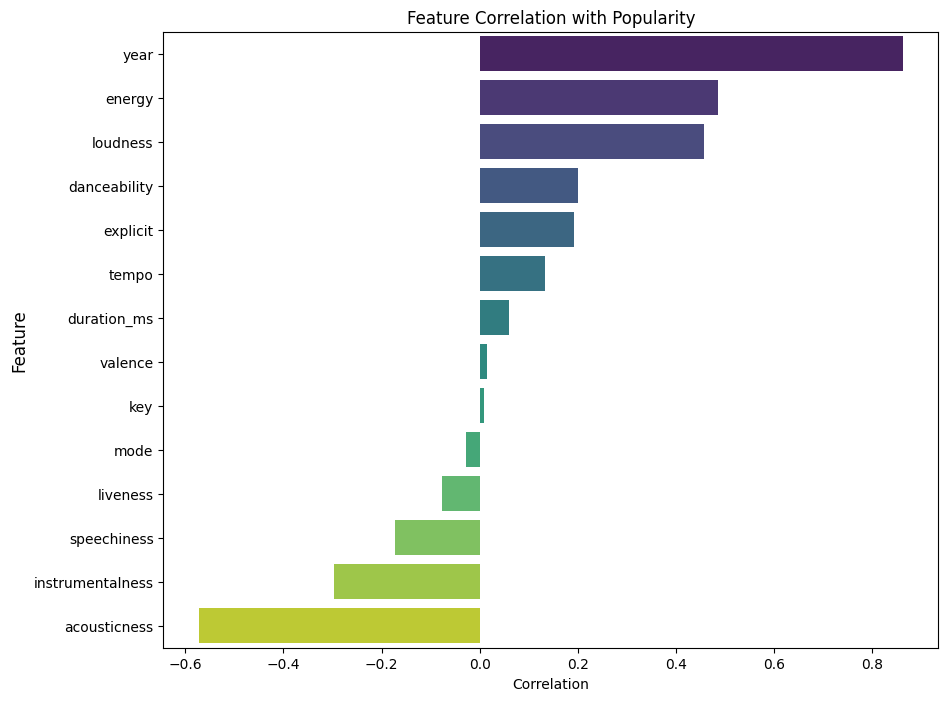

In [17]:
# Calculate the correlation matrix
correlation_matrix = X.corrwith(y)

# Convert to a DataFrame for better visualization
correlation_df = correlation_matrix.to_frame(name='Correlation').reset_index()
correlation_df.rename(columns={'index': 'Feature'}, inplace=True)

# Sort by correlation values (descending order)
correlation_df = correlation_df.sort_values(by='Correlation', ascending=False)

# Plot the correlation using seaborn
plt.figure(figsize=(10, 8))
sns.barplot(data=correlation_df, x='Correlation', y='Feature', palette='viridis')
plt.title('Feature Correlation with Popularity')
plt.xlabel('Correlation')
plt.ylabel('Feature', fontsize=12)
plt.show()

In [18]:
correlation_matrix

acousticness       -0.573162
danceability        0.199606
energy              0.485005
instrumentalness   -0.296750
liveness           -0.076464
loudness            0.457051
speechiness        -0.171979
tempo               0.133310
valence             0.014200
duration_ms         0.059597
explicit            0.191543
key                 0.007826
mode               -0.028897
year                0.862442
dtype: float64

# **Music Over Time**

Using the data grouped by year, we can understand how the overall sound of music has changed from 1921 to 2020.

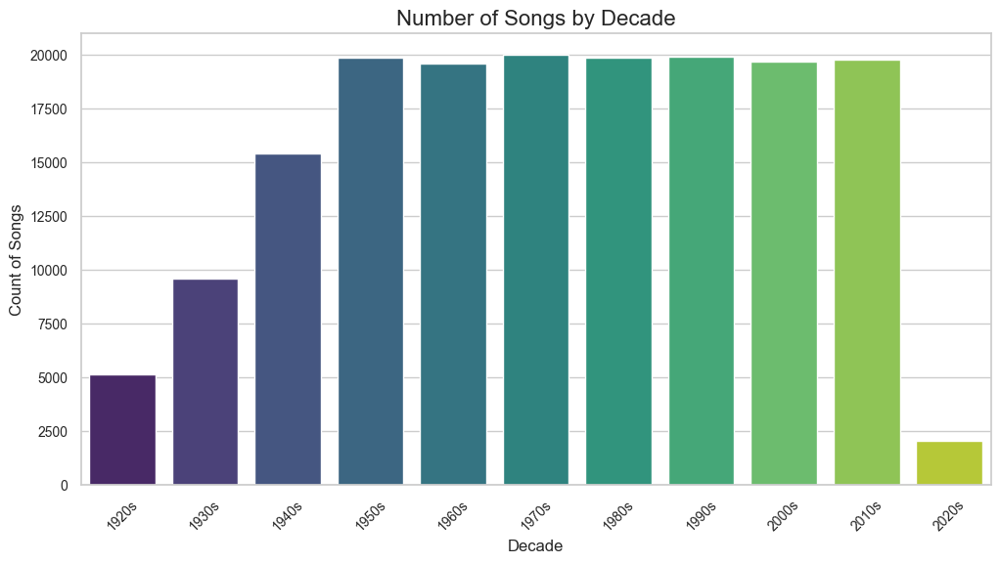

In [19]:
def get_decade(year):
    period_start = int(year / 10) * 10
    decade = f'{period_start}s'
    return decade

# Apply the function to create a new column 'decade'
df['decade'] = df['year'].apply(get_decade)

# Set the figure size and style
sns.set(rc={'figure.figsize': (12, 6)}, style="whitegrid")

# Create a countplot for the 'decade' column
order = sorted(df['decade'].unique())  # Ensure decades are in chronological order
sns.countplot(data=df, x='decade', order=order, palette='viridis')

# Add title and labels
plt.title('Number of Songs by Decade', fontsize=16)
plt.xlabel('Decade', fontsize=12)
plt.ylabel('Count of Songs', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)

# Display the plot
plt.show()

In [20]:
# Define the sound features to analyze
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

# Create a line plot using Plotly to visualize the trends of sound features over the years
fig = px.line(year_df, x='year', y=sound_features, title="Trends of Sound Features Over the Years")
fig.update_layout(xaxis_title="Year", yaxis_title="Feature Value")
fig.show()

# **Characteristics of Different Genres**

This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound.

In [21]:
top10_genres = genre_df.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

# **Clustering Genres with K-Means**

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

In [22]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Define the pipeline correctly
cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('kmeans', KMeans(n_clusters=10, random_state=42))  # Remove n_jobs
])
X = genre_df.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_df['cluster'] = cluster_pipeline.predict(X)

In [23]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_df['genres']
projection['cluster'] = genre_df['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.002s...
[t-SNE] Computed neighbors for 2973 samples in 0.123s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106079
[t-SNE] KL divergence after 1000 iterations: 1.393143


# **Clustering Songs with K-Means**

In [24]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=False))
                                 ], verbose=False)

X = df.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
df['cluster_label'] = song_cluster_labels

In [25]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = df['name']
projection['cluster'] = df['cluster_label']


fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

# **Build Recommender System**

* Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.
* This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.
* [Spotipy](https://spotipy.readthedocs.io/en/2.16.1/) is a Python client for the Spotify Web API that makes it easy for developers to fetch data and query Spotify’s catalog for songs. You have to install using `pip install spotipy`
* After installing Spotipy, you will need to create an app on the [Spotify Developer’s page](https://developer.spotify.com/) and save your Client ID and secret key.

In [26]:
%pip install spotipy


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: pip3 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [39]:
import os

os.environ["SPOTIFY_CLIENT_ID"] = "8a80643719904c299b8dd9d474b15fcc"
os.environ["SPOTIFY_CLIENT_SECRET"] = "b4299470e23a41cfa0b07ac20d265d2d"


In [40]:
import os
print(os.environ.get("SPOTIFY_CLIENT_ID"))  # Should print the client ID or None
print(os.environ.get("SPOTIFY_CLIENT_SECRET"))  # Should print the secret or None


8a80643719904c299b8dd9d474b15fcc
b4299470e23a41cfa0b07ac20d265d2d


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=os.environ["SPOTIFY_CLIENT_ID"],
                                                           client_secret=os.environ["SPOTIFY_CLIENT_SECRET"])dd)

def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [30]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import numpy as np

# Define the numerical columns
number_cols = [
    'valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 
    'explicit', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 
    'popularity', 'speechiness', 'tempo'
]

def get_song_data(song, spotify_data):
    """
    Retrieve song data from the Spotify dataset based on song name and year.
    """
    try:
        filtered_data = spotify_data[
            (spotify_data['name'] == song['name']) & 
            (spotify_data['year'] == song['year'])
        ]
        if filtered_data.empty:
            return None
        return filtered_data.iloc[0]
    except Exception as e:
        print(f"Error retrieving song data: {e}")
        return None

def get_mean_vector(song_list, spotify_data):
    """
    Calculate the mean vector for a list of songs.
    """
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print(f"Warning: {song['name']} does not exist in Spotify or in the database.")
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)
    
    if not song_vectors:
        return None
    
    song_matrix = np.array(song_vectors)
    return np.mean(song_matrix, axis=0)

def flatten_dict_list(dict_list):
    """
    Flatten a list of dictionaries into a single dictionary with lists as values.
    """
    flattened_dict = defaultdict(list)
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
    return flattened_dict

def recommend_songs(song_list, spotify_data, n_songs=10):
    """
    Recommend songs based on a list of input songs.
    """
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    if song_center is None:
        print("Error: Unable to calculate mean vector. No valid songs found.")
        return []
    
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, metric='cosine')
    indices = np.argsort(distances)[:, :n_songs][0]
    
    recommended_songs = spotify_data.iloc[indices]
    recommended_songs = recommended_songs[~recommended_songs['name'].isin(song_dict['name'])]
    
    # Format the result as a list of dictionaries
    return recommended_songs[metadata_cols].to_dict(orient='records')

In [31]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  df)

[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"},
 {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"},
 {'name': "Breakfast At Tiffany's",
  'year': 1995,
  'artists': "['Deep Blue Something']"},
 {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': "It's Not Living (If It's Not With You)",
  'year': 2018,
  'artists': "['The 1975']"},
 {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"},
 {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"},
 {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"},
 {'name': "Club Can't Handle Me (feat. David Guetta)",
  'year': 2010,
  'artists': "['Flo Rida', 'David Guetta']"}]

In [32]:
recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993},
                {'name': 'Stay Away', 'year': 1993}],  df)

[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"},
 {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"},
 {'name': "Breakfast At Tiffany's",
  'year': 1995,
  'artists': "['Deep Blue Something']"},
 {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"},
 {'name': "It's Not Living (If It's Not With You)",
  'year': 2018,
  'artists': "['The 1975']"},
 {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"},
 {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"},
 {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"},
 {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"},
 {'name': "Club Can't Handle Me (feat. David Guetta)",
  'year': 2010,
  'artists': "['Flo Rida', 'David Guetta']"}]

In [33]:
recommend_songs([
    {'name': 'Mr. Brightside', 'year': 2003, 'artists': "['The Killers']"},
    {'name': 'Take Me Out', 'year': 2004, 'artists': "['Franz Ferdinand']"},
    {'name': 'Seven Nation Army', 'year': 2003, 'artists': "['The White Stripes']"},
    {'name': 'Uptown Funk', 'year': 2014, 'artists': "['Mark Ronson', 'Bruno Mars']"},
    {'name': 'Radioactive', 'year': 2012, 'artists': "['Imagine Dragons']"},
    {'name': 'Somebody That I Used to Know', 'year': 2011, 'artists': "['Gotye', 'Kimbra']"},
    {'name': 'Rolling in the Deep', 'year': 2010, 'artists': "['Adele']"},
    {'name': 'Feel Good Inc.', 'year': 2005, 'artists': "['Gorillaz']"},
    {'name': 'Viva La Vida', 'year': 2008, 'artists': "['Coldplay']"},
    {'name': 'Boulevard of Broken Dreams', 'year': 2004, 'artists': "['Green Day']"}
]
, df)

[{'name': 'Christmas Tree Farm', 'year': 2019, 'artists': "['Taylor Swift']"},
 {'name': 'Maniac', 'year': 2020, 'artists': "['Conan Gray']"},
 {'name': 'Heroes (we could be)',
  'year': 2015,
  'artists': "['Alesso', 'Tove Lo']"},
 {'name': 'When It Rains It Pours', 'year': 2017, 'artists': "['Luke Combs']"},
 {'name': 'Best Of Me', 'year': 2018, 'artists': "['BTS']"},
 {'name': 'All Night', 'year': 2017, 'artists': "['The Vamps', 'Matoma']"},
 {'name': 'La Da Dee', 'year': 2019, 'artists': "['Cody Simpson']"},
 {'name': 'Brand New Man - with Luke Combs',
  'year': 2019,
  'artists': "['Brooks & Dunn', 'Luke Combs']"},
 {'name': 'So Am I', 'year': 2020, 'artists': "['Ava Max']"},
 {'name': 'Feel This Moment (feat. Christina Aguilera)',
  'year': 2012,
  'artists': "['Pitbull', 'Christina Aguilera']"}]